<a href="https://colab.research.google.com/github/cian-ps/dog-breed-detection/blob/main/dog_breeds.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Dog Breed Detection Project

## Problem Definition
Create a classifier capable of determining a dog's breed from a photo using Tensorflow.

## Data
Data comes from Kaggle's Dog Breed Identification competition.
You are provided with a training set and a test set of images of dogs. Each image has a filename that is its unique id. The dataset comprises 120 breeds of dogs. The goal of the competition is to create a classifier capable of determining a dog's breed from a photo.


* train.zip - the training set, you are provided the breed for these dogs
* test.zip - the test set, you must predict the probability of each breed for each image
* sample_submission.csv - a sample submission file in the correct format
* labels.csv - the breeds for the images in the train set


## Evaluation
Submissions are evaluated on **Multi Class Log Loss** between the predicted probability and the observed target.



In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf
import tensorflow_hub as hub
import os
from sklearn.model_selection import train_test_split
import tf_keras
import datetime

print(f"""Tensorflow Version: {tf.__version__}
Tensorflow Hub version: {hub.__version__}""")
if not tf.config.list_physical_devices("GPU"):
  raise SystemError("GPU device not found")
print(f"GPU found at {tf.test.gpu_device_name()}")

Tensorflow Version: 2.19.0
Tensorflow Hub version: 0.16.1
GPU found at /device:GPU:0


In [ ]:
train_dataset_dir = "drive/MyDrive/dog-breed-data/train/"

def bool_array(labels):
  """
  takes the labels and returns an array of boolean values where one value is true.
  """
  unique = np.unique(labels)
  return np.array([i == unique for i in labels])

def image_file_paths(id):
  files = [f"{train_dataset_dir}{i}.jpg" for i in id]
  if len(files) != len(os.listdir(train_dataset_dir)):
    raise Exception("file paths do not match actual amount of files")
  return np.array(files)

df = pd.read_csv("drive/MyDrive/dog-breed-data/labels.csv")
x = image_file_paths(df.id)
y = bool_array(df.breed)
(x_train, x_val,
 y_train, y_val) = train_test_split(x, y, test_size=0.2,
                                    random_state=42)
x_train.shape, y_train.shape, x_val.shape, y_val.shape

((8177,), (8177, 120), (2045,), (2045, 120))

In [ ]:
import tf_keras
import datetime
%load_ext tensorboard

NUM_SAMPLES = 1000
NUM_EPOCHS = 100
IMAGE_SIZE = 224
BATCH_SIZE = 32
INPUT_SHAPE = [IMAGE_SIZE, IMAGE_SIZE, 3]
OUTPUT_SHAPE = len(np.unique(df.breed))
mobilenet_v2 = "https://kaggle.com/models/google/mobilenet-v2/TensorFlow2/130-224-classification/1"

def process_image(x):
  # load and decode jpg file
  image = tf.image.decode_jpeg(tf.io.read_file(x), channels=3)
  # convert dtype
  image = tf.image.convert_image_dtype(image, tf.float32)
  # resize
  tensor = tf.image.resize(image, [IMAGE_SIZE, IMAGE_SIZE])
  return tensor

def image_label_tuples(x, y):
  return process_image(x), y

def data_batches(x, y=None, val=False, test=False):
  if test:
    print("creating test data batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(x)))
    return data.map(process_image).batch(BATCH_SIZE)
  elif val:
    print("creating validation data batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(x),
                                               tf.constant(y)))
    return data.map(image_label_tuples).batch(BATCH_SIZE)
  else:
    print("creating training data batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(x),
                                              tf.constant(y)))
    shuffled = data.shuffle(buffer_size=len(x))
    return shuffled.map(image_label_tuples).batch(BATCH_SIZE)

def create_model():
  print(f"creating a model with {mobilenet_v2}")
  m = tf_keras.Sequential([
      hub.KerasLayer(mobilenet_v2, input_shape=INPUT_SHAPE),
      tf_keras.layers.Dense(units=OUTPUT_SHAPE, activation="softmax")
      ])
  m.compile(loss=tf_keras.losses.CategoricalCrossentropy(),
            optimizer=tf_keras.optimizers.Adam(),
            metrics=["accuracy"])
  m.build(INPUT_SHAPE)
  return m

def tensorboard_callback():
  logdir = os.path.join("drive/MyDrive/dog-breed-data/log/",
                        datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
  return tf_keras.callbacks.TensorBoard(logdir)

early_stopping = tf_keras.callbacks.EarlyStopping(monitor="val_accuracy",
                                                  patience=3)

def train_model(train, val):
  m = create_model()
  tb = tensorboard_callback()
  m.fit(x=train, epochs=NUM_EPOCHS,validation_data=val,
        validation_freq=1, callbacks=[tb, early_stopping])
  return m

(lim_x_train, lim_x_val,
 lim_y_train, lim_y_val) = train_test_split(x[:NUM_SAMPLES], y[:NUM_SAMPLES],
                                            test_size=0.2, random_state=42)

train_data = data_batches(lim_x_train, lim_y_train)
val_data = data_batches(lim_x_val, lim_y_val, val=True)
print(f"{train_data.element_spec}\n{val_data.element_spec}\n")
#model = train_model(train_data, val_data)

creating training data batches...
creating validation data batches...
(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))
(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))



In [ ]:
%tensorboard --logdir drive/MyDrive/dog-breed-data/log

<IPython.core.display.Javascript object>

loading from drive/MyDrive/dog-breed-data/models/20251217-171500-1000-images-mobilenet_v2-Adam.keras
7/7 [==============================] - 82s 11s/step - loss: 1.3835 - accuracy: 0.6200
[1.3834549188613892, 0.6200000047683716]
7/7 [==============================] - 1s 118ms/step


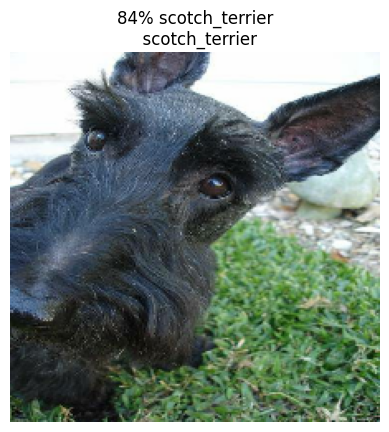

In [ ]:
def unbatching(d):
  im = []
  label = []
  for i, j in d.unbatch().as_numpy_iterator():
    im.append(i)
    label.append(j)
  return im, label

def plot_pred(pred, ims, labels, n=1):
  plt.imshow(ims[n])
  plt.axis("off")
  plt.title(f"""{np.max(pred[n] * 100):2.0f}% {np.unique(df.breed)[np.argmax(pred[n])]}
  {np.unique(df.breed)[np.argmax(labels[n])]}""")

def save_model(m, suffix):
  dir = os.path.join("drive/MyDrive/dog-breed-data/models/",
                     datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
  path = f"{dir}-{suffix}.keras"
  print(f"saving to {path}")
  m.save(path)

def load_model(path):
  print(f"loading from {path}")
  return tf_keras.models.load_model(path,
                                    custom_objects={"KerasLayer": hub.KerasLayer})

loaded_model1000 = load_model("drive/MyDrive/dog-breed-data/models/20251217-171500-1000-images-mobilenet_v2-Adam.keras")
print(loaded_model1000.evaluate(val_data))


preds = loaded_model1000.predict(val_data, verbose=1)
val_ims, val_labels = unbatching(val_data)

plot_pred(preds, val_ims, val_labels)

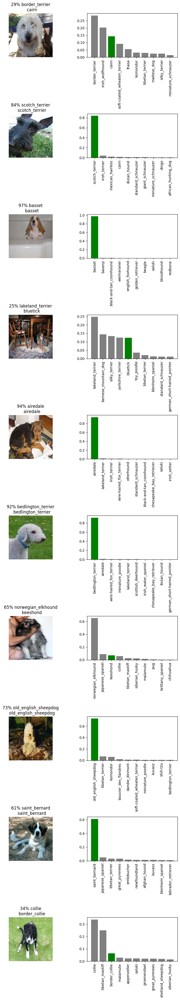

In [ ]:
def plot_top10(pred, labels, n=1):
  top10_index = np.argsort(pred[n])[-10:][::-1]
  top_guesses = np.unique(df.breed)[top10_index]
  top_values = pred[n][top10_index]
  truth = np.unique(df.breed)[np.argmax(labels[n])]
  barplot = plt.bar(np.arange(len(top_guesses)),
                    top_values, color="grey")
  plt.xticks(np.arange(len(top_guesses)),
             labels=top_guesses, rotation="vertical")
  if np.isin(truth, top_guesses):
    barplot[np.argmax(top_guesses == truth)].set_color("green")

index = 1
rows = 10
cols = 2

plt.figure(figsize=(cols*4, rows*4))
for i in range(rows):
  plt.subplot(rows, cols, index)
  plot_pred(preds, val_ims, val_labels, i)
  plt.subplot(rows, cols, index + 1)
  plot_top10(preds, val_labels, i)
  index += 2
plt.tight_layout(h_pad=1.0)
plt.show()

In [ ]:
full_data = data_batches(x, y)
print(full_data.element_spec)
full_model = create_model()
tb = tensorboard_callback()
full_early_stopping = tf_keras.callbacks.EarlyStopping(monitor="accuracy",
                                                       patience=3)
full_model.fit(x=full_data, epochs=NUM_EPOCHS,
               callbacks=[tb, full_early_stopping])

creating training data batches...
(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))
creating a model with https://kaggle.com/models/google/mobilenet-v2/TensorFlow2/130-224-classification/1
Epoch 1/100
320/320 [==============================] - 3900s 12s/step - loss: 1.3239 - accuracy: 0.6685
Epoch 2/100
320/320 [==============================] - 45s 140ms/step - loss: 0.3985 - accuracy: 0.8850
Epoch 3/100
320/320 [==============================] - 43s 133ms/step - loss: 0.2340 - accuracy: 0.9371
Epoch 4/100
320/320 [==============================] - 43s 133ms/step - loss: 0.1530 - accuracy: 0.9635
Epoch 5/100
320/320 [==============================] - 43s 133ms/step - loss: 0.1062 - accuracy: 0.9789
Epoch 6/100
320/320 [==============================] - 44s 137ms/step - loss: 0.0759 - accuracy: 0.9877
Epoch 7/100
320/320 [==============================] - 43s 134ms/step - loss: 0.0593 - accuracy: 0.9916
Epoch 8

In [ ]:
save_model(full_model, "full-mobilenet_v2-Adam")

saving to drive/MyDrive/dog-breed-data/models/20251218-114254-full-mobilenet_v2-Adam.keras


In [ ]:
loaded_full_model = load_model("drive/MyDrive/dog-breed-data/models/20251218-114254-full-mobilenet_v2-Adam.keras")
testdir = "drive/MyDrive/dog-breed-data/test/"
test_paths = [testdir + i for i in os.listdir(testdir)]
test_data = data_batches(test_paths, test=True)
test_preds = loaded_full_model.predict(test_data, verbose=1)

loading from drive/MyDrive/dog-breed-data/models/20251218-114254-full-mobilenet_v2-Adam.keras
creating test data batches...
324/324 [==============================] - 329s 976ms/step


In [ ]:
np.savetxt("drive/MyDrive/dog-breed-data/test_preds.csv", test_preds, delimiter=",")

In [ ]:
submission = pd.DataFrame(test_preds, columns=np.unique(df.breed))
ids = []
for i in os.listdir(testdir):
  ids.append(os.path.splitext(i)[0])
submission.insert(0, "id", ids)
submission.to_csv("drive/MyDrive/dog-breed-data/submission_mobilenet_v2.csv",
                  index=False)
submission

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,dfe02d52ca281aaca6215a42fee6245c,1.477017e-08,7.165903e-11,8.323763e-11,1.382078e-10,2.575890e-09,1.354205e-12,1.713726e-07,7.309273e-11,2.843074e-08,...,2.667794e-06,2.636593e-09,3.169970e-09,4.243352e-10,2.165499e-10,8.539931e-11,7.199777e-09,9.535085e-12,9.651904e-11,1.289668e-08
1,dca9642123204fd3df080147b05e4af3,3.756808e-10,2.072551e-04,6.153113e-11,1.808313e-08,6.511663e-11,4.689014e-14,1.075171e-08,5.186458e-13,5.389547e-13,...,6.819369e-13,6.061086e-13,2.821328e-14,1.819558e-11,5.231151e-11,9.422359e-13,3.378398e-12,3.102828e-10,2.208972e-10,4.575533e-09
2,e2976affb6d88a3e627ff8c31844f20a,4.290953e-09,4.004532e-09,2.453193e-09,3.816460e-09,4.952433e-08,5.662538e-08,1.572892e-08,3.429472e-10,4.391093e-09,...,1.766080e-09,8.297717e-09,2.235235e-09,9.887987e-10,4.241143e-08,1.255858e-07,1.353306e-07,3.276505e-07,1.087248e-02,3.131036e-08
3,dcd3cfe0cd6d363a3ed21639c434c8d3,5.640785e-08,3.720479e-13,2.661347e-09,1.031303e-10,3.660849e-10,7.242594e-06,2.155179e-06,1.704346e-03,2.606378e-11,...,6.386250e-09,4.729061e-05,6.586590e-11,1.366978e-07,5.439490e-10,4.991828e-08,2.848193e-07,1.452999e-11,1.646903e-06,8.870502e-10
4,e5b13519aa192a386dc0c5dd7d096e70,1.032692e-11,1.731061e-11,1.109683e-10,2.245067e-09,5.549781e-10,8.861020e-06,3.760257e-11,1.201105e-11,9.679936e-11,...,1.217104e-10,8.065678e-14,4.729613e-12,1.318880e-07,4.928411e-10,2.843670e-10,2.977009e-11,2.062273e-09,6.352833e-12,1.240195e-11
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10352,08db8163ff5451ae44b7496b5c9ee05a,4.778643e-11,1.222493e-11,6.883089e-13,2.419501e-07,3.283676e-08,1.365711e-10,2.021000e-09,2.527716e-10,6.932980e-11,...,1.697725e-09,1.707917e-06,7.224741e-11,1.469337e-09,3.066330e-13,9.468546e-11,3.099779e-12,1.131711e-05,4.953004e-10,3.060646e-08
10353,07d94fdf5371753b114f7ce7505d0fe2,2.760901e-06,2.393492e-07,1.022544e-08,5.010809e-09,1.078874e-07,1.162623e-09,5.513128e-06,3.696754e-09,2.254665e-10,...,3.527933e-04,1.110719e-05,2.033507e-07,3.952821e-06,1.035184e-08,4.935692e-09,7.391075e-05,4.653836e-08,9.912202e-01,4.752680e-05
10354,0854e34e53c9dd84579d4c37086dbdf5,1.318440e-10,2.177801e-12,3.437814e-12,5.309910e-10,1.197701e-11,1.093769e-11,1.734939e-10,1.422602e-10,8.458344e-13,...,1.312327e-09,4.600898e-09,1.505896e-10,8.859900e-11,1.654443e-13,1.639410e-12,3.653759e-12,1.744338e-07,1.679316e-11,3.329609e-09
10355,076144231ddb6a687889696e1978edfc,1.342714e-13,1.946132e-10,6.027792e-10,2.261817e-08,3.948671e-16,2.695960e-10,7.649581e-13,3.515335e-14,9.174350e-17,...,1.469632e-13,5.971850e-15,3.342007e-13,1.564255e-11,3.214176e-11,6.967540e-15,6.510502e-14,3.448367e-11,2.537254e-12,5.235304e-12


creating test data batches...
1/1 [==============================] - 0s 369ms/step


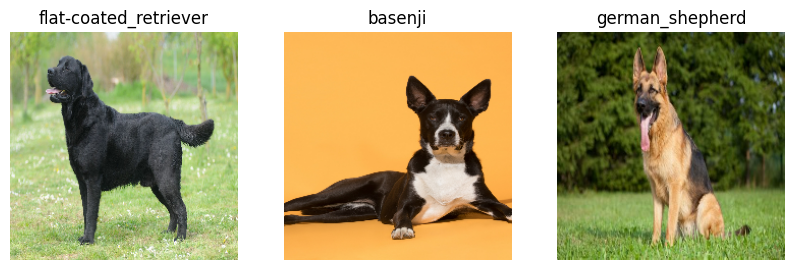

In [ ]:
customdir = "drive/MyDrive/dog-breed-data/custom_images/"
custom_data_paths = [customdir + i for i in os.listdir(customdir) if not i.startswith(".")]
custom_data = data_batches(custom_data_paths, test=True)
custom_preds = loaded_full_model.predict(custom_data, verbose=1)
custom_ims = [i for i in custom_data.unbatch().as_numpy_iterator()]
plt.figure(figsize=(10, 12))
for i, im in enumerate(custom_ims):
  breed = np.unique(df.breed)[np.argmax(custom_preds[i])]
  plt.subplot(1, 3, i+1, title=breed)
  plt.imshow(im)
  plt.axis("off")